# Model vs Ground Truth Gallery

This notebook visualizes, class by class, three views for every test image:
1. Input image
2. Ground truth mask
3. Predicted mask from `model.predict`

In [1]:
from pathlib import Path
from collections import Counter
import importlib

import cv2
import numpy as np
import matplotlib.pyplot as plt

import model
model = importlib.reload(model)

CLASSES = ["good", "bent_lead", "cut_lead", "damaged_case", "misplaced"]

# Set to integer (for faster debug) or keep None to show all images.
LIMIT_PER_CLASS = None
ROWS_PER_FIGURE = 8

PROJECT_ROOT = Path.cwd()
if not (PROJECT_ROOT / "transistor" / "test").exists():
    candidate = PROJECT_ROOT / "Transformers" / "proj01"
    if (candidate / "transistor" / "test").exists():
        PROJECT_ROOT = candidate
    else:
        raise FileNotFoundError("Could not find transistor/test. Run from proj01 or workspace root.")

TEST_ROOT = PROJECT_ROOT / "transistor" / "test"
GT_ROOT = PROJECT_ROOT / "transistor" / "ground_truth"

print(f"PROJECT_ROOT: {PROJECT_ROOT}")
print(f"TEST_ROOT:    {TEST_ROOT}")
print(f"GT_ROOT:      {GT_ROOT}")
print("Model module reloaded from disk.")

PROJECT_ROOT: c:\Users\MateuszOmen\Desktop\studia\sem6\zaawanasowane_algorytmy_wizyjne_projekty\Transformers\proj01
TEST_ROOT:    c:\Users\MateuszOmen\Desktop\studia\sem6\zaawanasowane_algorytmy_wizyjne_projekty\Transformers\proj01\transistor\test
GT_ROOT:      c:\Users\MateuszOmen\Desktop\studia\sem6\zaawanasowane_algorytmy_wizyjne_projekty\Transformers\proj01\transistor\ground_truth
Model module reloaded from disk.


In [2]:
def load_rgb(path: Path) -> np.ndarray:
    bgr = cv2.imread(str(path), cv2.IMREAD_COLOR)
    if bgr is None:
        raise FileNotFoundError(path)
    return cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)


def to_binary_mask(mask: np.ndarray) -> np.ndarray:
    if mask.ndim != 2:
        raise ValueError("Mask must be 2D")
    return (mask > 0).astype(np.uint8) * 255


def load_gt_or_zero(class_name: str, img_path: Path, shape_hw: tuple[int, int]) -> np.ndarray:
    h, w = shape_hw
    if class_name == "good":
        return np.zeros((h, w), dtype=np.uint8)

    gt_path = GT_ROOT / class_name / f"{img_path.stem}_mask.png"
    gt = cv2.imread(str(gt_path), cv2.IMREAD_GRAYSCALE)
    if gt is None:
        raise FileNotFoundError(f"Missing GT mask: {gt_path}")
    if gt.shape != (h, w):
        gt = cv2.resize(gt, (w, h), interpolation=cv2.INTER_NEAREST)
    return to_binary_mask(gt)


def iou(mask_a: np.ndarray, mask_b: np.ndarray) -> float:
    a = mask_a > 0
    b = mask_b > 0
    union = np.logical_or(a, b).sum()
    if union == 0:
        return 1.0
    inter = np.logical_and(a, b).sum()
    return float(inter / union)


def iter_class_files(class_name: str):
    folder = TEST_ROOT / class_name
    files = sorted(folder.glob("*.png"))
    if LIMIT_PER_CLASS is not None:
        files = files[: int(LIMIT_PER_CLASS)]
    return files


def run_prediction_for_file(class_name: str, img_path: Path) -> dict:
    image = load_rgb(img_path)
    gt_mask = load_gt_or_zero(class_name, img_path, image.shape[:2])

    pred_mask, pred_label = model.predict(image)
    pred_mask = to_binary_mask(pred_mask.astype(np.uint8))
    if pred_mask.shape != gt_mask.shape:
        pred_mask = cv2.resize(pred_mask, (gt_mask.shape[1], gt_mask.shape[0]), interpolation=cv2.INTER_NEAREST)

    return {
        "class_name": class_name,
        "file_name": img_path.name,
        "image": image,
        "gt_mask": gt_mask,
        "pred_mask": pred_mask,
        "pred_label": str(pred_label),
        "iou": iou(pred_mask, gt_mask),
    }

In [3]:
records_by_class = {}

for class_name in CLASSES:
    rows = []
    for img_path in iter_class_files(class_name):
        rows.append(run_prediction_for_file(class_name, img_path))
    records_by_class[class_name] = rows

print("Loaded samples by class:")
for class_name in CLASSES:
    print(f"- {class_name}: {len(records_by_class[class_name])}")

Loaded samples by class:
- good: 50
- bent_lead: 9
- cut_lead: 9
- damaged_case: 9
- misplaced: 9


In [4]:
print("Per-class summary:")
print("class         n   mean_iou   pred_label_counts")
print("-" * 80)

for class_name in CLASSES:
    rows = records_by_class[class_name]
    n = len(rows)
    mean_iou = float(np.mean([r["iou"] for r in rows])) if n else float("nan")
    counts = Counter(r["pred_label"] for r in rows)
    print(f"{class_name:12s} {n:3d}  {mean_iou:8.4f}   {dict(counts)}")

Per-class summary:
class         n   mean_iou   pred_label_counts
--------------------------------------------------------------------------------
good          50    1.0000   {'good': 50}
bent_lead      9    0.0000   {'good': 9}
cut_lead       9    0.0003   {'misplaced': 1, 'good': 8}
damaged_case   9    0.0000   {'good': 9}
misplaced      9    0.6294   {'good': 1, 'misplaced': 8}


In [5]:
def show_class_gallery(class_name: str, rows: list[dict], rows_per_figure: int = 8):
    if not rows:
        print(f"No samples for class {class_name}")
        return

    total = len(rows)
    for start in range(0, total, rows_per_figure):
        chunk = rows[start : start + rows_per_figure]
        n = len(chunk)

        fig, axes = plt.subplots(n, 3, figsize=(15, 3.6 * n))
        if n == 1:
            axes = np.expand_dims(axes, axis=0)

        for i, rec in enumerate(chunk):
            axes[i, 0].imshow(rec["image"])
            axes[i, 0].set_title(
                f"{rec['class_name']}/{rec['file_name']}\nGT class={rec['class_name']}"
            )
            axes[i, 0].axis("off")

            axes[i, 1].imshow(rec["gt_mask"], cmap="gray", vmin=0, vmax=255)
            axes[i, 1].set_title("Ground truth mask")
            axes[i, 1].axis("off")

            axes[i, 2].imshow(rec["pred_mask"], cmap="gray", vmin=0, vmax=255)
            axes[i, 2].set_title(
                f"Predicted mask\npred={rec['pred_label']} | IoU={rec['iou']:.3f}"
            )
            axes[i, 2].axis("off")

        fig.suptitle(
            f"Class: {class_name} | samples {start + 1}-{start + n} of {total}",
            fontsize=14,
        )
        plt.tight_layout()
        plt.show()


=== good ===


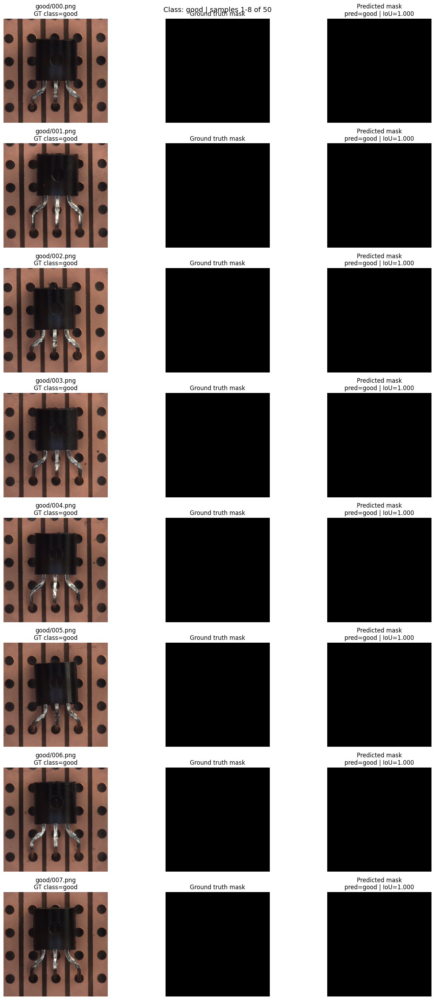

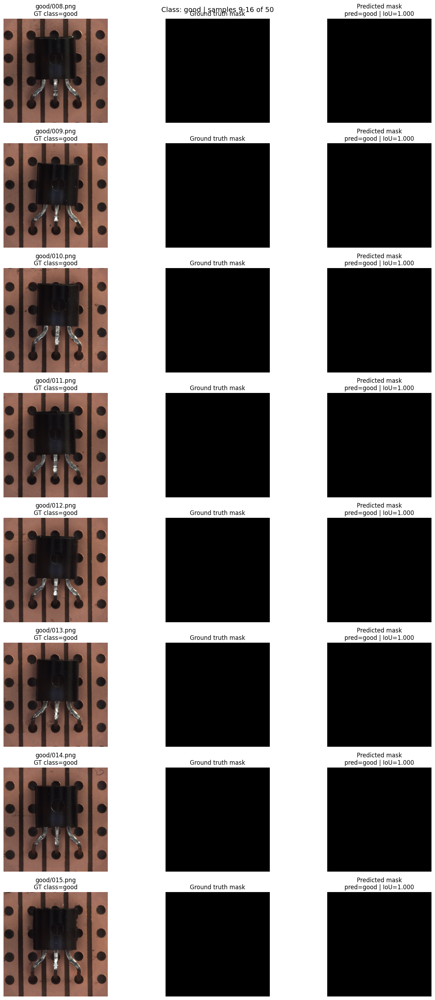

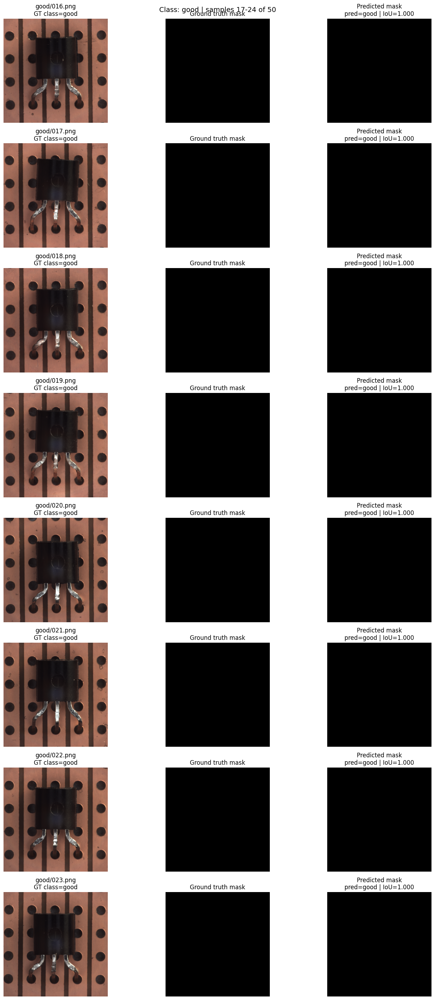

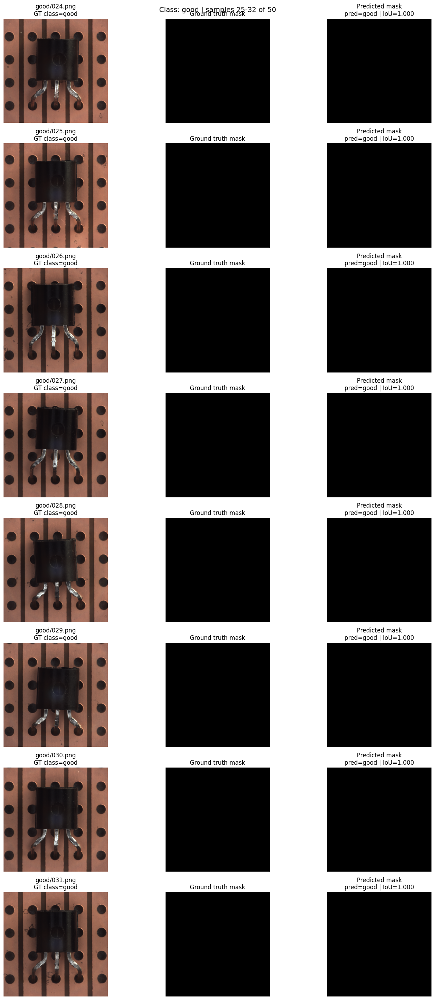

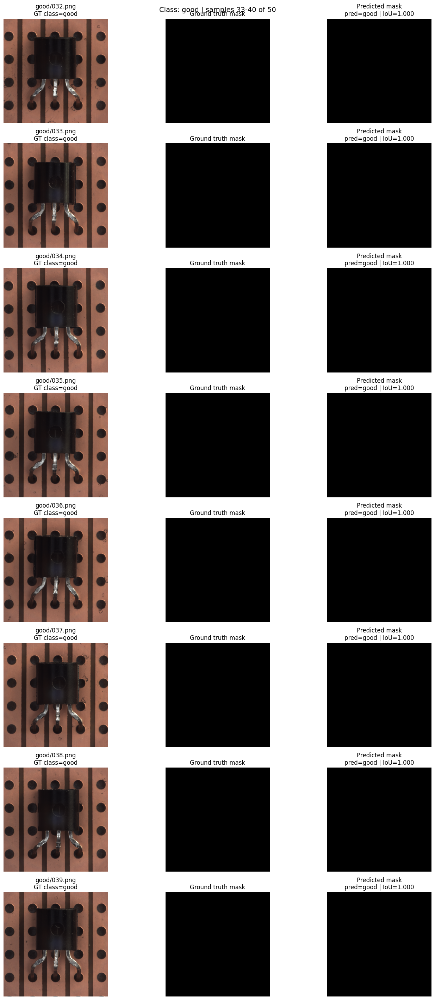

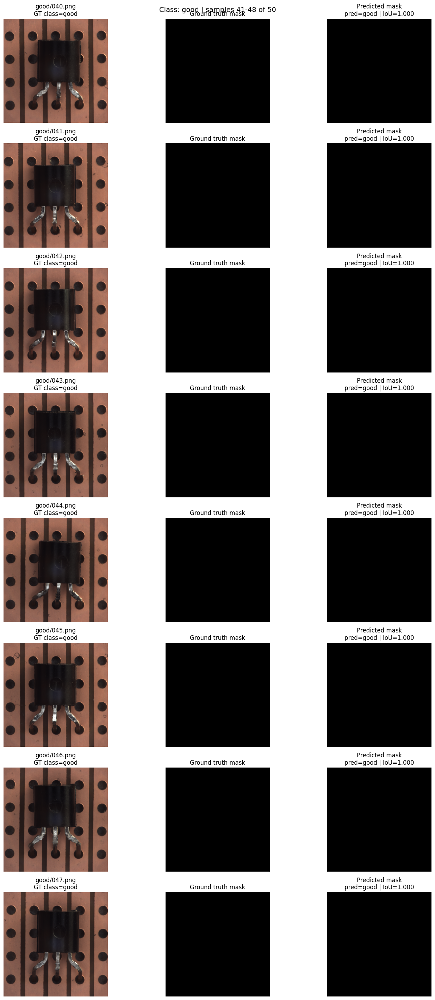

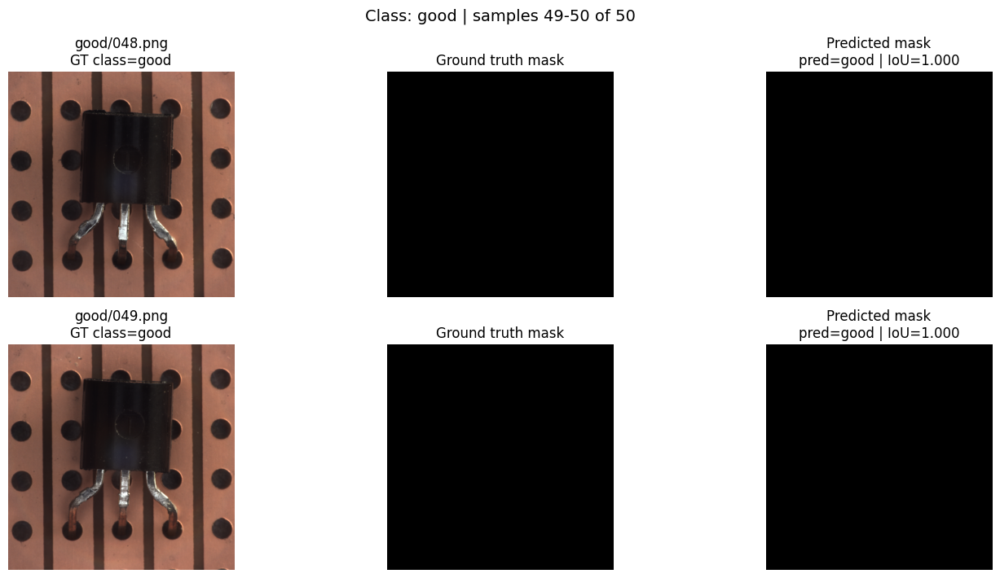


=== bent_lead ===


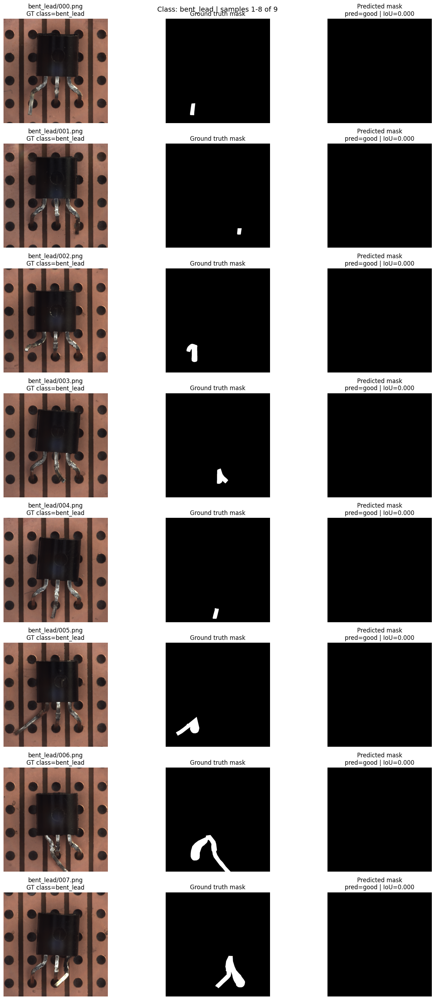

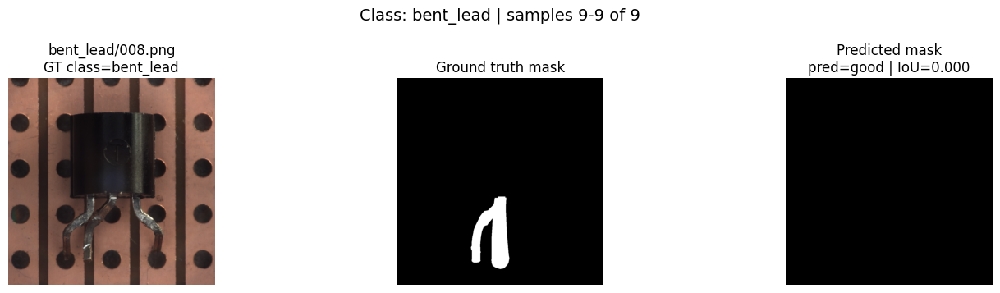


=== cut_lead ===


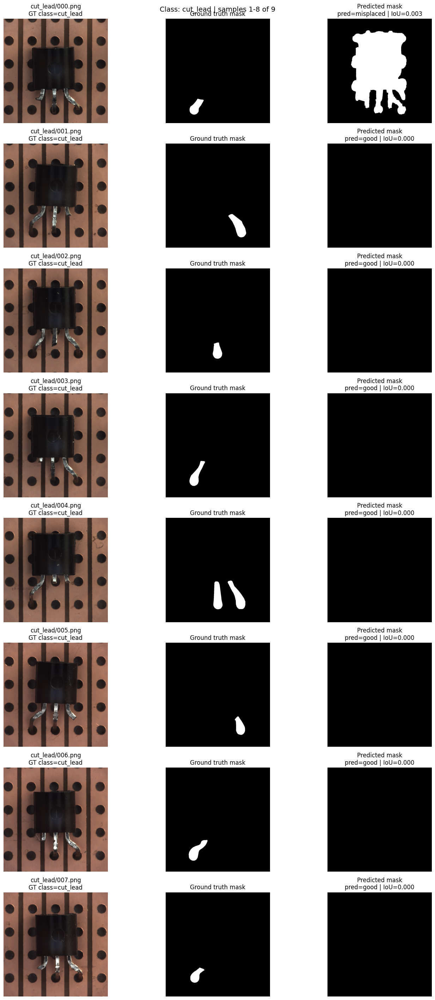

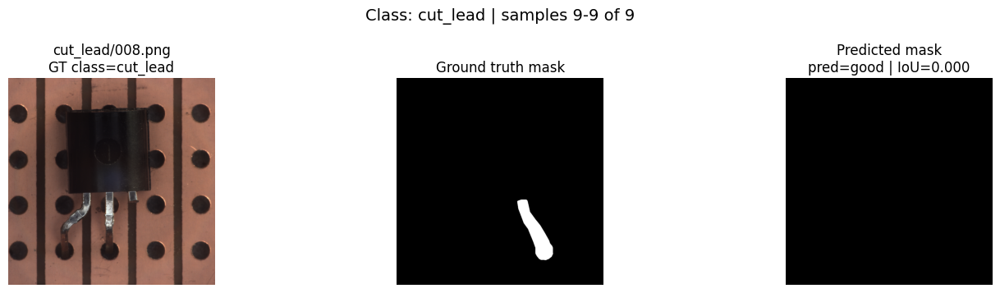


=== damaged_case ===


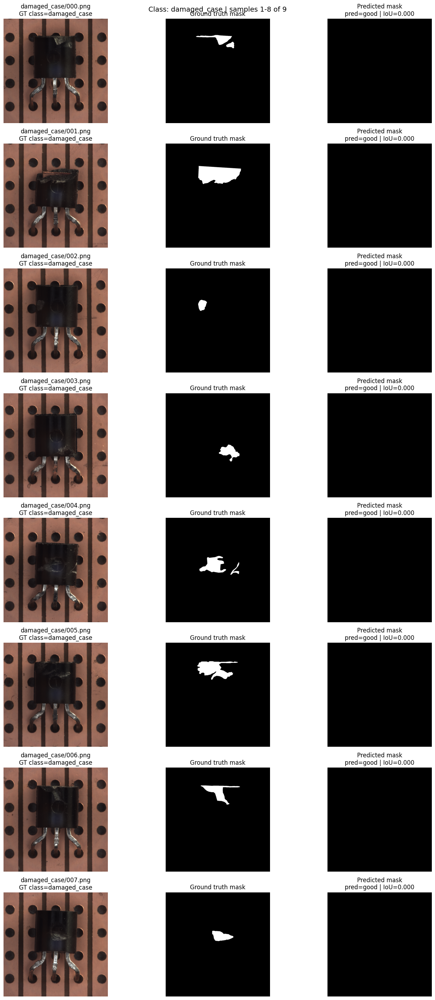

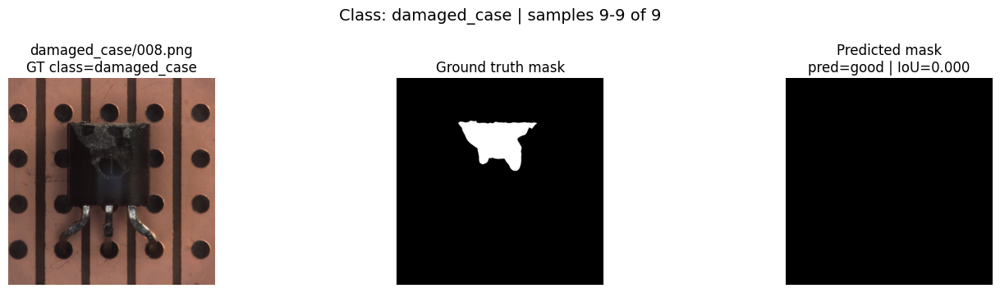


=== misplaced ===


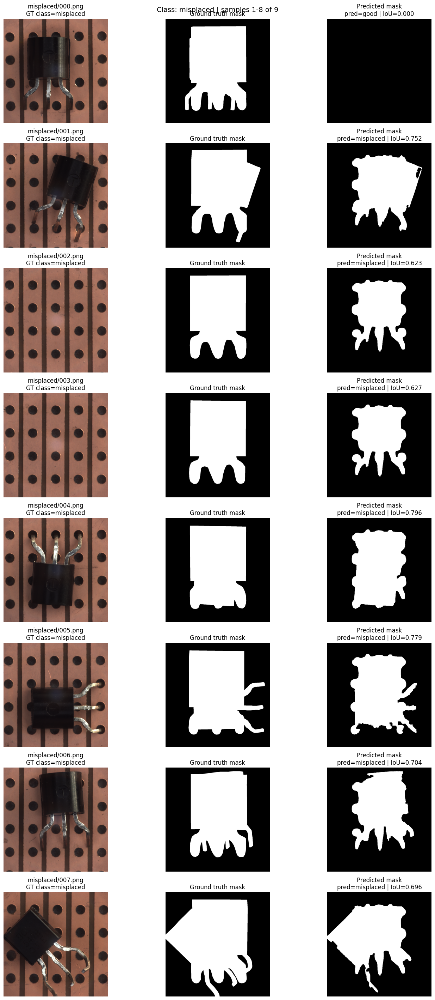

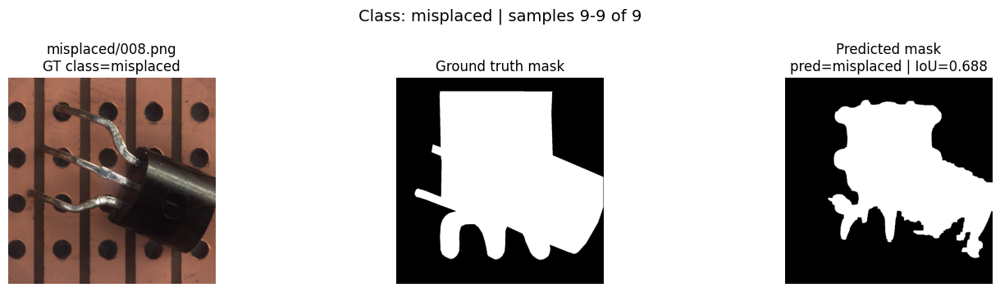

In [6]:
for class_name in CLASSES:
    print(f"\n=== {class_name} ===")
    show_class_gallery(class_name, records_by_class[class_name], rows_per_figure=ROWS_PER_FIGURE)

## Notes
- `good` uses a zero ground-truth mask by design.
- Set `LIMIT_PER_CLASS` in the config cell for quick debugging runs.
- Set `ROWS_PER_FIGURE` to control how many samples are shown per figure.